# IMPORTS

In [1]:
import os
import sys
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Sampler
from torchvision import transforms, models
import argparse
from PIL import Image
import cv2
from sklearn.metrics import average_precision_score, roc_auc_score
from tqdm.notebook import tqdm
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
from typing import Type, Any, Callable, Union, List, Optional

# Utilise GPU
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

PyTorch version: 2.6.0+cu126
CUDA available: True
CUDA device: NVIDIA GeForce MX350
Using device: cuda


# Loss Function

In [2]:
class DeviationLoss(nn.Module):
    # loss function inherited from nn module
    def __init__(self):
        super().__init__()

    def forward(self, y_pred, y_true):
        confidence_margin = 5.0
        ref = torch.normal(mean=0.0, std=torch.ones(5000)).to(device)
        dev = (y_pred - torch.mean(ref)) / torch.std(ref)
        inlier_loss = torch.abs(dev)
        outlier_loss = torch.abs((confidence_margin - dev).clamp_(min=0.))
        return torch.mean((1 - y_true) * inlier_loss + y_true * outlier_loss)

In [3]:
# to try out other losses, criterion is set as a parameter
def build_criterion(criterion):
    if criterion == "deviation":
        print("Loss: Deviation")
        return DeviationLoss()
    else:
        raise NotImplementedError(f"Criterion {criterion} not implemented")

# NN Architecture

We have two parts to our neural network - First few layers using a pre trained CNN model like resnet's weights to extract features, and the next few layers for anomaly scoring based on the extracted features

In [4]:
# Feature extraction network
class feature_resnet18(nn.Module):
    def __init__(self):
        super(feature_resnet18, self).__init__()
        self.net = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        
    def forward(self, x):
        x = self.net.conv1(x)
        x = self.net.bn1(x)
        x = self.net.relu(x)
        x = self.net.maxpool(x)
        x = self.net.layer1(x)
        x = self.net.layer2(x)
        x = self.net.layer3(x)
        x = self.net.layer4(x)
        # we are returning not the classified output, but the features extracted 
        # by first few layers of resnet18
        return x

In [5]:
# For resnet18, we have the ouput dimension as 512
NET_OUT_DIM = {'resnet18': 512}

def build_feature_extractor(backbone):
    if backbone == "resnet18":
        print("Feature extractor: ResNet-18")
        return feature_resnet18()
    else:
        raise NotImplementedError(f"Backbone {backbone} not implemented")

# Main network model
class SemiADNet(nn.Module):
    def __init__(self, args):
        super(SemiADNet, self).__init__()
        self.args = args
        self.feature_extractor = build_feature_extractor(self.args.backbone)
        self.conv = nn.Conv2d(in_channels=NET_OUT_DIM[self.args.backbone], out_channels=1, kernel_size=1, padding=0)

    def forward(self, image):
        if self.args.n_scales == 0:
            raise ValueError("n_scales must be greater than 0")

        image_pyramid = list()
        for s in range(self.args.n_scales):
            image_scaled = F.interpolate(image, size=self.args.img_size // (2 ** s)) if s > 0 else image
            feature = self.feature_extractor(image_scaled)

            scores = self.conv(feature)
            if self.args.topk > 0:
                scores = scores.view(int(scores.size(0)), -1)
                topk = max(int(scores.size(1) * self.args.topk), 1)
                scores = torch.topk(torch.abs(scores), topk, dim=1)[0]
                scores = torch.mean(scores, dim=1).view(-1, 1)
            else:
                scores = scores.view(int(scores.size(0)), -1)
                scores = torch.mean(scores, dim=1).view(-1, 1)

            image_pyramid.append(scores)
        scores = torch.cat(image_pyramid, dim=1)
        score = torch.mean(scores, dim=1)
        return score.view(-1, 1)

# Data Preprocessing

This MVTecAD dataset class forms the backbone of the DevNet anomaly detection pipeline by loading, organizing, and preprocessing industrial inspection images. It cleanly separates normal samples from anomalous ones, applies appropriate transformations (with augmentation for training and standardization for testing), and provides specialized access methods to retrieve either basic data for training or enriched samples with ground truth segmentation masks for visualization and evaluation.

In [6]:
# Datasets and DataLoaders

class BaseADDataset(Dataset):
    def __init__(self):
        self.normal_idx = None
        self.outlier_idx = None

class MVTecAD(BaseADDataset):
    def __init__(self, args, train=True):
        super().__init__()
        self.args = args
        self.train = train
        self.classname = self.args.classname

        self.root = os.path.join(self.args.dataset_root, self.classname)
        self.transform = self.transform_train() if self.train else self.transform_test()
        self.transform_anomaly = self.transform_test()  # Fixed for Python 3.12 compatibility

        normal_data = list()
        split = 'train' if self.train else 'test'
        normal_files = os.listdir(os.path.join(self.root, split, 'good'))
        for file in normal_files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.npy')):
                normal_data.append(f"{split}/good/{file}")

        outlier_data = self.split_outlier()
        outlier_data.sort()

        normal_label = np.zeros(len(normal_data)).tolist()
        outlier_label = np.ones(len(outlier_data)).tolist()

        self.images = normal_data + outlier_data
        self.labels = np.array(normal_label + outlier_label)
        self.normal_idx = np.argwhere(self.labels == 0).flatten()
        self.outlier_idx = np.argwhere(self.labels == 1).flatten()

    def split_outlier(self):
        outlier_data_dir = os.path.join(self.root, 'test')
        outlier_classes = os.listdir(outlier_data_dir)
        outlier_data = list()
        for cl in outlier_classes:
            if cl == 'good':
                continue
            outlier_file = os.listdir(os.path.join(outlier_data_dir, cl))
            for file in outlier_file:
                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.npy')):
                    outlier_data.append(f'test/{cl}/{file}')
        if self.args.n_anomaly > len(outlier_data)//2:
            print(f"Total outlier data: {len(outlier_data)}")
            print("Number of outlier data in training set should be less than half of outlier data!")
            raise ValueError("Too many outliers requested for training")
        
        # Use NumPy's RandomState with seed for reproducibility
        np.random.seed(self.args.ramdn_seed)
        np.random.shuffle(outlier_data)
        
        if self.train:
            return outlier_data[0:self.args.n_anomaly]
        else:
            return outlier_data[self.args.n_anomaly:]

    def load_image(self, path):
        try:
            if path.endswith('.npy'):
                img = np.load(path).astype(np.uint8)
                img = img[:, :, :3]
                return Image.fromarray(img)
            
            img = Image.open(path).convert('RGB')
            return img
        except Exception as e:
            print(f"Error loading image {path}: {str(e)}")
            # Return a small black image as fallback
            return Image.new('RGB', (224, 224), color='black')

    def transform_train(self):
        composed_transforms = transforms.Compose([
            transforms.Resize((self.args.img_size, self.args.img_size)),
            transforms.RandomRotation(180),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
        return composed_transforms

    def transform_test(self):
        composed_transforms = transforms.Compose([
            transforms.Resize((self.args.img_size, self.args.img_size)),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
        return composed_transforms

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        transform = self.transform
        image = self.load_image(os.path.join(self.root, self.images[index]))
        sample = {'image': transform(image), 'label': self.labels[index]}
        return sample

    def getitem(self, index):
        if index in self.outlier_idx and self.train:
            transform = self.transform_anomaly
        else:
            transform = self.transform
        image = self.load_image(os.path.join(self.root, self.images[index]))
        raw_image = np.array(image)
        
        if index in self.outlier_idx:
            mask_path = os.path.join(self.root, self.images[index]).replace('test', 'ground_truth').replace('.png', '_mask.png')
            if os.path.exists(mask_path):
                image_label = np.array(self.load_image(mask_path))
            else:
                # Create dummy mask if not found
                image_label = np.zeros_like(raw_image)
        else:
            image_label = np.zeros_like(raw_image)
            
        sample = {
            'image': transform(image), 
            'label': self.labels[index], 
            'seg_label': image_label, 
            'raw_image': raw_image
        }
        return sample

def worker_init_fn_seed(worker_id):
    seed = 10
    seed += worker_id
    np.random.seed(seed)

A custom batch sampler that ensures each training batch contains equal proportions of normal and anomalous examples, crucial for effective semi-supervised learning in anomaly detection. The implementation uses Python generators for memory-efficient sampling while maintaining reproducibility through careful seed management.

In [7]:
class BalancedBatchSampler(Sampler):
    def __init__(self, cfg, dataset: BaseADDataset):
        super(BalancedBatchSampler, self).__init__(dataset)
        self.cfg = cfg
        self.dataset = dataset

        self.normal_generator = self.random_generator(self.dataset.normal_idx)
        self.outlier_generator = self.random_generator(self.dataset.outlier_idx)
        if self.cfg.n_anomaly != 0:
            self.n_normal = self.cfg.batch_size // 2
            self.n_outlier = self.cfg.batch_size - self.n_normal
        else:
            self.n_normal = self.cfg.batch_size
            self.n_outlier = 0

    @staticmethod
    def random_generator(idx_list):
        while True:
            random_list = np.random.permutation(idx_list)
            for i in random_list:
                yield i

    def __len__(self):
        return self.cfg.steps_per_epoch
    
    def __iter__(self):
        for _ in range(self.cfg.steps_per_epoch):
            batch = []

            for _ in range(self.n_normal):
                batch.append(next(self.normal_generator))

            for _ in range(self.n_outlier):
                batch.append(next(self.outlier_generator))
            yield batch

def build_dataloader(args, **kwargs):
    train_set = MVTecAD(args, train=True)
    test_set = MVTecAD(args, train=False)
    
    # Check if datasets have data
    if len(train_set) == 0:
        raise ValueError(f"Training set is empty. Please check the dataset path: {args.dataset_root}/{args.classname}")
    
    if len(test_set) == 0:
        raise ValueError(f"Test set is empty. Please check the dataset path: {args.dataset_root}/{args.classname}")
    
    # If using Windows or having issues, set num_workers to 0
    if os.name == 'nt':  # Check if Windows
        print("Windows detected, setting num_workers to 0 to avoid multiprocessing issues")
        kwargs['num_workers'] = 0
    
    train_loader = DataLoader(train_set,
                             worker_init_fn=worker_init_fn_seed,
                             batch_sampler=BalancedBatchSampler(args, train_set),
                             persistent_workers=False if kwargs.get('num_workers', 0) == 0 else True,
                             **kwargs)
    test_loader = DataLoader(test_set,
                            batch_size=args.batch_size,
                            shuffle=False,
                            worker_init_fn=worker_init_fn_seed,
                            persistent_workers=False if kwargs.get('num_workers', 0) == 0 else True,
                            **kwargs)
    return train_loader, test_loader

# Utility Functions

In [8]:
# Utility functions

def aucPerformance(mse, labels, prt=True):
    roc_auc = roc_auc_score(labels, mse)
    ap = average_precision_score(labels, mse)
    if prt:
        print(f"AUC-ROC: {roc_auc:.4f}, AUC-PR: {ap:.4f}")
    return roc_auc, ap

def convert_to_grayscale(im_as_arr):
    grayscale_im = np.sum(np.abs(im_as_arr), axis=0)
    im_max = np.percentile(grayscale_im, 99)
    im_min = np.min(grayscale_im)
    if im_max > im_min:
        grayscale_im = np.clip((grayscale_im - im_min) / (im_max - im_min), 0, 1)
    grayscale_im = np.expand_dims(grayscale_im, axis=0)
    return grayscale_im

def show_cam_on_image(img, mask, label=None, title=None, save_path=None):
    """
    Display the CAM visualization
    """
    plt.figure(figsize=(15, 5))
    
    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title("Original Image")
    plt.axis('off')
    
    # Heatmap
    heatmap = cv2.applyColorMap(np.uint8(255*mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    
    plt.subplot(1, 3, 2)
    plt.imshow(cam)
    plt.title("Anomaly Heatmap")
    plt.axis('off')
    
    # Ground truth (if available)
    if label is not None:
        plt.subplot(1, 3, 3)
        plt.imshow(label)
        plt.title("Ground Truth")
        plt.axis('off')
    
    if title:
        plt.suptitle(title)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path)
        
    plt.show()

# Localizing Anomalies for visulization

This section of code is extremely useful for visualising the source of anomaly. We want to know whether the image is anomaly or not, and if it is, what part of the image is the main source of anomalous nature. So to get this, we pass the image through a trained model and see what gradient is prodced for each pixel. Plotting the graident as a heatmap in the shape of the image helps us to see what part if contributing more to the training, and hence more likely to be the source of anomaly.

In [9]:
# Functions for anomaly localization and visualization

def localize_anomalies(args, model, test_set):
    """Run anomaly localization on test set outliers"""
    model.eval()
    
    outputs = []
    fmaps = []
    grads = []
    seg_labels = []
    outliers_cam = []
    inputs = []
    outlier_scores = []
    
    # Process each outlier
    for i in test_set.outlier_idx:
        model.zero_grad()
        sample = test_set.getitem(i)
        input_tensor = sample['image'].unsqueeze(0).to(device)
        inputs.append(np.array(sample['raw_image']))
        input_tensor.requires_grad = True
        
        output = model(input_tensor)
        outlier_scores.append(output.data.cpu().numpy()[0][0])
        output.backward()

        grad = input_tensor.grad
        grad_temp = convert_to_grayscale(grad.cpu().numpy().squeeze(0))
        grad_temp = grad_temp.squeeze(0)
        grad_temp = gaussian_filter(grad_temp, sigma=4)
        outliers_cam.append(grad_temp)

        outputs.append(output.item())
        seg_labels.append(np.array(sample['seg_label']))
    
    # Visualization directory
    vis_dir = os.path.join(args.experiment_dir, 'vis')
    os.makedirs(vis_dir, exist_ok=True)
    
    # Calculate pixel-level AUC scores
    aucs = []
    print(f"Detected anomalies: {len(outliers_cam)}")
    if len(outliers_cam) == 0:
        print('Cannot find anomaly images')
        return None
    
    # Visualize and calculate metrics
    for i, (cam, raw, label) in enumerate(zip(outliers_cam, inputs, seg_labels)):
        raw = np.float32(cv2.resize(raw, (args.img_size, args.img_size))) / 255
        if label.shape != (args.img_size, args.img_size, 3):
            label = cv2.resize(label, (args.img_size, args.img_size))
        
        # Save visualization
        save_path = os.path.join(vis_dir, f"{args.classname}_cam_{i}.jpg")
        show_cam_on_image(raw, cam, label, 
                          title=f"Anomaly #{i} - Score: {outlier_scores[i]:.4f}", 
                          save_path=save_path)
        
        # Calculate AUC for pixel-level detection
        if np.max(label) > 0:  # Only calculate if ground truth exists
            binary_label = (label > 0).astype(np.float32)
            if binary_label.ndim == 3:
                binary_label = binary_label[:,:,0]  # Take first channel if multi-channel
                
            cam_line = cam.reshape(-1)
            label_line = binary_label.reshape(-1)
            auc, _ = aucPerformance(cam_line, label_line, prt=False)
            aucs.append(auc)
            print(f"Anomaly #{i} - Pixel AUC: {auc:.4f}")
    
    if aucs:
        aucs = np.array(aucs)
        print(f"Pixel-level AUC-ROC: {np.mean(aucs):.4f}")
    
    print(f"Visualization results are saved in: {vis_dir}")
    
    return outliers_cam, outlier_scores

# Training class 

In [10]:
# Trainer class to handle training and evaluation

class Trainer(object):
    def __init__(self, args):
        self.args = args

        # Define Dataloader
        kwargs = {'num_workers': args.workers}
        self.train_loader, self.test_loader = build_dataloader(args, **kwargs)

        self.model = SemiADNet(args)
        self.criterion = build_criterion(args.criterion)
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=0.0002, weight_decay=1e-5)
        self.scheduler = torch.optim.lr_scheduler.StepLR(self.optimizer, step_size=10, gamma=0.1)

        self.model = self.model.to(device)
        self.criterion = self.criterion.to(device)
        
        # Make experiment directory if it doesn't exist
        if not os.path.exists(args.experiment_dir):
            os.makedirs(args.experiment_dir)

    def train(self, epoch):
        train_loss = 0.0
        self.model.train()
        tbar = tqdm(self.train_loader, desc=f'Epoch {epoch}')
        for i, sample in enumerate(tbar):
            image, target = sample['image'], sample['label']
            image, target = image.to(device), target.to(device)

            output = self.model(image)
            loss = self.criterion(output, target.unsqueeze(1).float())
            self.optimizer.zero_grad()
            loss.backward()

            torch.nn.utils.clip_grad_norm_(self.model.parameters(), 1.0)
            self.optimizer.step()
            train_loss += loss.item()
            tbar.set_description(f'Epoch:{epoch}, Train loss: {train_loss / (i + 1):.3f}')
        self.scheduler.step()
        return train_loss / len(tbar)

    def eval(self):
        self.model.eval()
        tbar = tqdm(self.test_loader, desc='Evaluating')
        test_loss = 0.0
        total_pred = np.array([])
        total_target = np.array([])
        for i, sample in enumerate(tbar):
            try:
                image, target = sample['image'], sample['label']
                image, target = image.to(device), target.to(device)
                with torch.no_grad():
                    output = self.model(image)
                loss = self.criterion(output, target.unsqueeze(1).float())
                test_loss += loss.item()
                tbar.set_description(f'Test loss: {test_loss / (i + 1):.3f}')
                total_pred = np.append(total_pred, output.data.cpu().numpy())
                total_target = np.append(total_target, target.cpu().numpy())
            except Exception as e:
                print(f"Error processing batch {i}: {str(e)}")
                continue
                
        if len(total_pred) == 0:
            print("No valid predictions were made. Check your dataset.")
            return 0.5, 0.5, float('inf')  # Return default values
            
        roc, pr = aucPerformance(total_pred, total_target)
        return roc, pr, test_loss / len(tbar) if len(tbar) > 0 else float('inf')

    def save_weights(self, filename):
        torch.save(self.model.state_dict(), os.path.join(self.args.experiment_dir, filename))
        print(f"Model saved to {os.path.join(self.args.experiment_dir, filename)}")

In [12]:
# Main training and evaluation script

class Args:
    """Class to hold command-line arguments"""
    def __init__(self, **kwargs):
        self.__dict__.update(kwargs)

def parse_args(**kwargs):
    """Create an Args object with default values, overridden by any provided kwargs"""
    args = Args(
        batch_size=48,
        steps_per_epoch=20,
        epochs=50,
        ramdn_seed=42,
        workers=4,
        cuda=torch.cuda.is_available(),
        dataset_root='./data/mvtec_anomaly_detection',
        experiment_dir='./experiment',
        classname='carpet',
        weight_name='model.pkl',
        img_size=448,
        n_anomaly=10,
        n_scales=2,
        backbone='resnet18',
        criterion='deviation',
        topk=0.1
    )
    
    # Override defaults with any provided arguments
    for key, value in kwargs.items():
        setattr(args, key, value)
    
    return args

def train_model(args):
    """Train the model with the given arguments"""
    # Set random seed for reproducibility
    torch.manual_seed(args.ramdn_seed)
    np.random.seed(args.ramdn_seed)
    
    # Initialize trainer
    trainer = Trainer(args)
    
    # Log the configuration
    print("\nTraining with configuration:")
    for name, value in vars(args).items():
        print(f"{name}: {value}")
    
    # Save settings to file
    with open(os.path.join(args.experiment_dir, 'setting.txt'), 'w') as f:
        f.write('------------------ start ------------------\n')
        for name, value in vars(args).items():
            f.write(f'{name}: {value}\n')
        f.write('------------------- end -------------------')
    
    # Training loop
    train_losses = []
    test_losses = []
    roc_scores = []
    pr_scores = []
    
    # Initial evaluation
    print("\nInitial evaluation:")
    roc, pr, test_loss = trainer.eval()
    roc_scores.append(roc)
    pr_scores.append(pr)
    test_losses.append(test_loss)
    
    # Train for specified number of epochs
    for epoch in range(args.epochs):
        print(f"\nEpoch {epoch+1}/{args.epochs}")
        train_loss = trainer.train(epoch)
        train_losses.append(train_loss)
        
        # Evaluate after each epoch
        roc, pr, test_loss = trainer.eval()
        roc_scores.append(roc)
        pr_scores.append(pr)
        test_losses.append(test_loss)
        
        # Save best model based on ROC-AUC
        if roc == max(roc_scores):
            trainer.save_weights(args.weight_name)
            print(f"Best model saved (ROC-AUC: {roc:.4f})")
    
    # Plot training progress
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Training Loss')
    plt.plot(test_losses, label='Testing Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss vs. Epoch')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(roc_scores, label='ROC-AUC')
    plt.plot(pr_scores, label='PR-AUC')
    plt.xlabel('Epoch')
    plt.ylabel('Score')
    plt.title('Evaluation Metrics vs. Epoch')
    plt.legend()
    
    plt.tight_layout()
    plt.savefig(os.path.join(args.experiment_dir, 'training_progress.png'))
    plt.show()
    
    print(f"\nTraining complete. Best ROC-AUC: {max(roc_scores):.4f}")
    
    return trainer

def localize_anomalies_wrapper(args, model_path=None):
    """Run anomaly localization with the trained model"""
    # Initialize model
    model = SemiADNet(args).to(device)
    
    # Load trained weights
    if model_path is None:
        model_path = os.path.join(args.experiment_dir, args.weight_name)
    
    model.load_state_dict(torch.load(model_path, map_location=device))
    print(f"Loaded model from {model_path}")
    print(f"Testing and visualising the model on few cases -")
    
    # Initialize dataset
    test_set = MVTecAD(args, train=False)

    test_set_3 = test_set
    if len(test_set.outlier_idx) > 3:
    # Limit to first 3 outliers
        test_set_3.outlier_idx = test_set.outlier_idx[:3]
    
    # Perform localization
    results = localize_anomalies(args, model, test_set_3)
    
    return results

# Model training

In [13]:
def run_demo(classname):
    """Run a complete demo of training and anomaly localization"""
    # Check if dataset exists
    mvtec_dir = "./data/mvtec_anomaly_detection"
    
    # Create experiment directory, if not existing
    os.makedirs("./experiment", exist_ok=True)
    
    # Define arguments for training
    args = parse_args(
        batch_size=16,  
        steps_per_epoch=3,  
        epochs=10,  
        img_size=224,  
        workers=0,  
        dataset_root=mvtec_dir,
        experiment_dir='./experiment',
        classname=classname,
        n_anomaly=5, # fewer anomalies per batch
        n_scales=2,
        weight_name=f'{classname}_model.pkl',
    )
    
    # Train the model
    print("\n==== Training Model ====")
    trainer = train_model(args)
    
    # Run anomaly localization
    print("\n==== Localizing Anomalies ====")
    localize_anomalies_wrapper(args)
    
    print("\nDemo complete!")


==== Training Model ====
Windows detected, setting num_workers to 0 to avoid multiprocessing issues
Feature extractor: ResNet-18


c:\Users\Maadurga computer\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\utils\data\sampler.py:77: UserWarning: `data_source` argument is not used and will be removed in 2.2.0.You may still have custom implementation that utilizes it.
  warnings.warn(


Loss: Deviation

Training with configuration:
batch_size: 16
steps_per_epoch: 3
epochs: 10
ramdn_seed: 42
workers: 0
cuda: True
dataset_root: ./data/mvtec_anomaly_detection
experiment_dir: ./experiment
classname: bottle
weight_name: bottle_model.pkl
img_size: 224
n_anomaly: 5
n_scales: 2
backbone: resnet18
criterion: deviation
topk: 0.1

Initial evaluation:


Evaluating:   0%|          | 0/5 [00:00<?, ?it/s]

AUC-ROC: 0.6526, AUC-PR: 0.8808

Epoch 1/10


Epoch 0:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/5 [00:00<?, ?it/s]

AUC-ROC: 0.7388, AUC-PR: 0.9177
Model saved to ./experiment\bottle_model.pkl
Best model saved (ROC-AUC: 0.7388)

Epoch 2/10


Epoch 1:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/5 [00:00<?, ?it/s]

AUC-ROC: 0.8741, AUC-PR: 0.9593
Model saved to ./experiment\bottle_model.pkl
Best model saved (ROC-AUC: 0.8741)

Epoch 3/10


Epoch 2:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/5 [00:00<?, ?it/s]

AUC-ROC: 0.8560, AUC-PR: 0.9555

Epoch 4/10


Epoch 3:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/5 [00:00<?, ?it/s]

AUC-ROC: 0.9405, AUC-PR: 0.9771
Model saved to ./experiment\bottle_model.pkl
Best model saved (ROC-AUC: 0.9405)

Epoch 5/10


Epoch 4:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/5 [00:00<?, ?it/s]

AUC-ROC: 0.9431, AUC-PR: 0.9782
Model saved to ./experiment\bottle_model.pkl
Best model saved (ROC-AUC: 0.9431)

Epoch 6/10


Epoch 5:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/5 [00:00<?, ?it/s]

AUC-ROC: 0.9664, AUC-PR: 0.9850
Model saved to ./experiment\bottle_model.pkl
Best model saved (ROC-AUC: 0.9664)

Epoch 7/10


Epoch 6:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/5 [00:00<?, ?it/s]

AUC-ROC: 0.9578, AUC-PR: 0.9813

Epoch 8/10


Epoch 7:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/5 [00:00<?, ?it/s]

AUC-ROC: 0.9828, AUC-PR: 0.9936
Model saved to ./experiment\bottle_model.pkl
Best model saved (ROC-AUC: 0.9828)

Epoch 9/10


Epoch 8:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/5 [00:00<?, ?it/s]

AUC-ROC: 0.9802, AUC-PR: 0.9925

Epoch 10/10


Epoch 9:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/5 [00:00<?, ?it/s]

AUC-ROC: 0.9750, AUC-PR: 0.9906


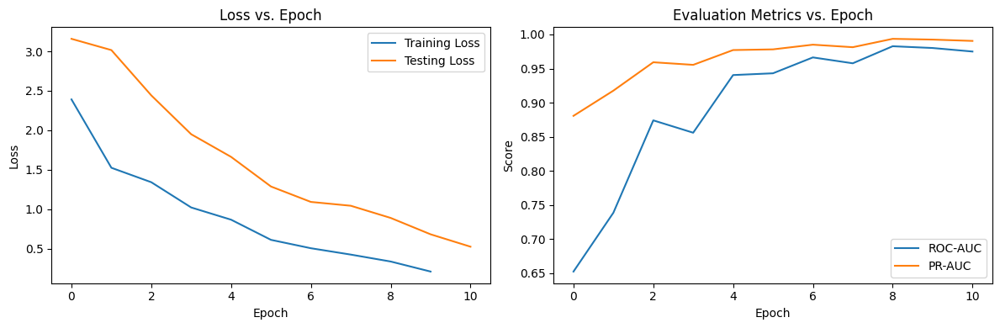


Training complete. Best ROC-AUC: 0.9828

==== Localizing Anomalies ====
Feature extractor: ResNet-18
Loaded model from ./experiment\bottle_model.pkl
Detected anomalies: 58


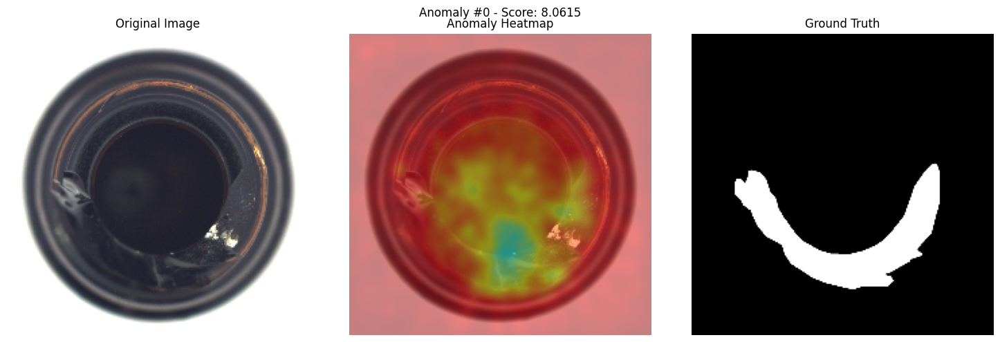

Anomaly #0 - Pixel AUC: 0.8838


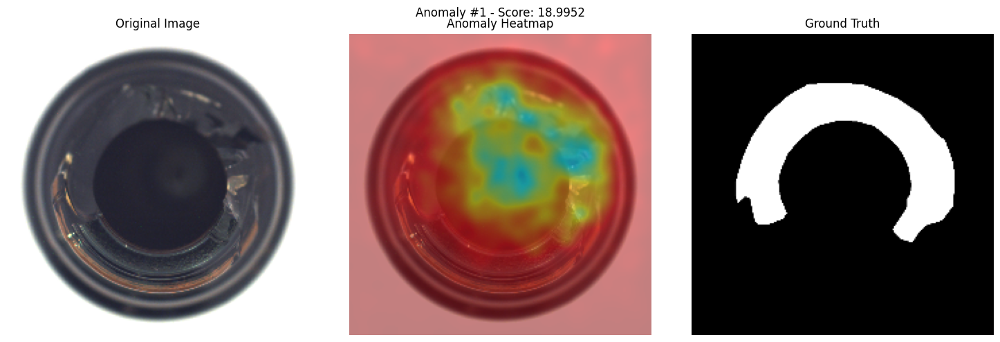

Anomaly #1 - Pixel AUC: 0.8769


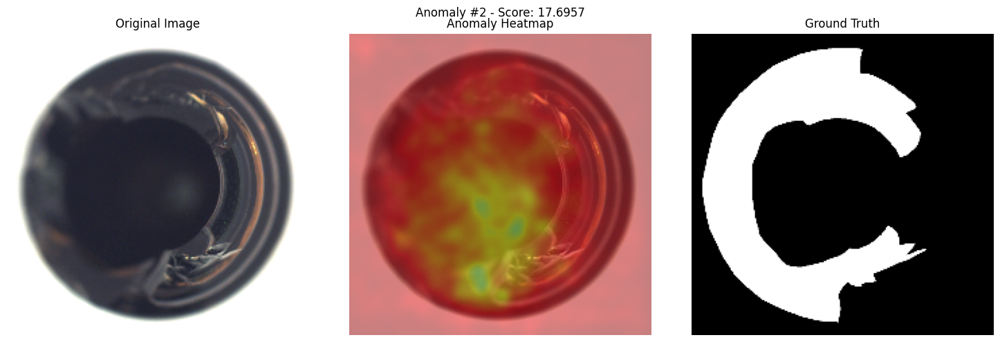

Anomaly #2 - Pixel AUC: 0.6969


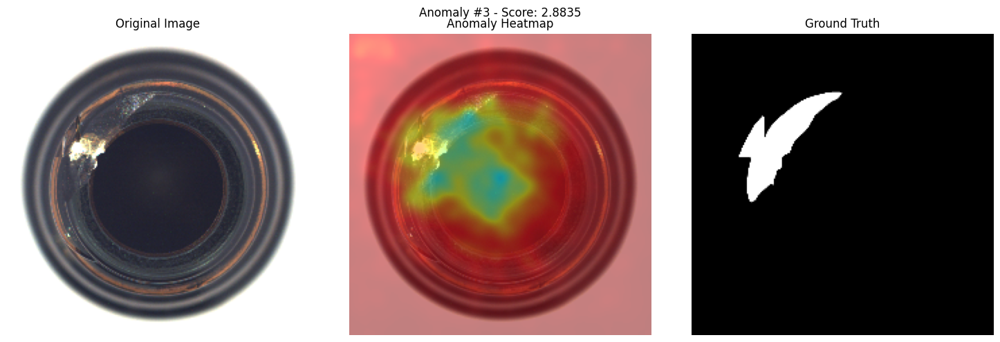

Anomaly #3 - Pixel AUC: 0.9252


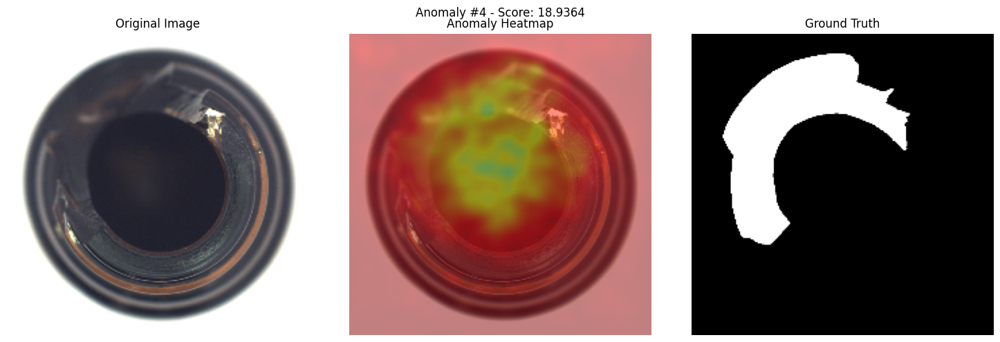

Anomaly #4 - Pixel AUC: 0.8088


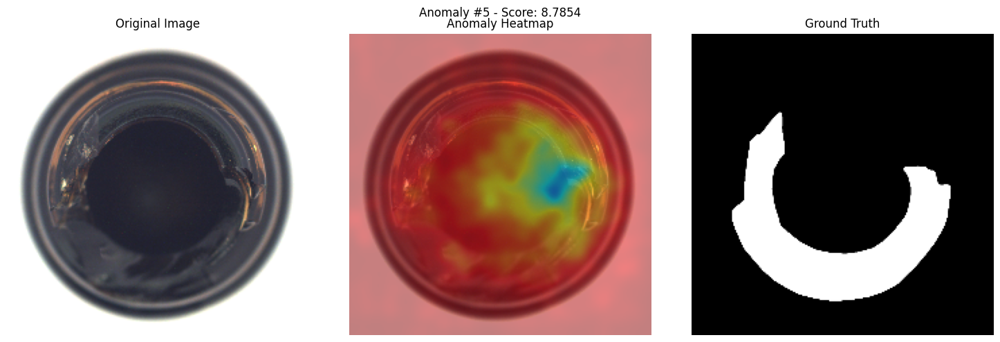

Anomaly #5 - Pixel AUC: 0.7732


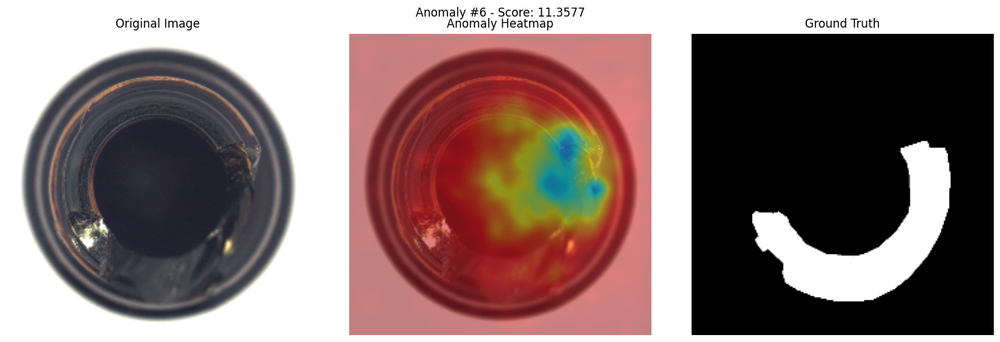

Anomaly #6 - Pixel AUC: 0.7954


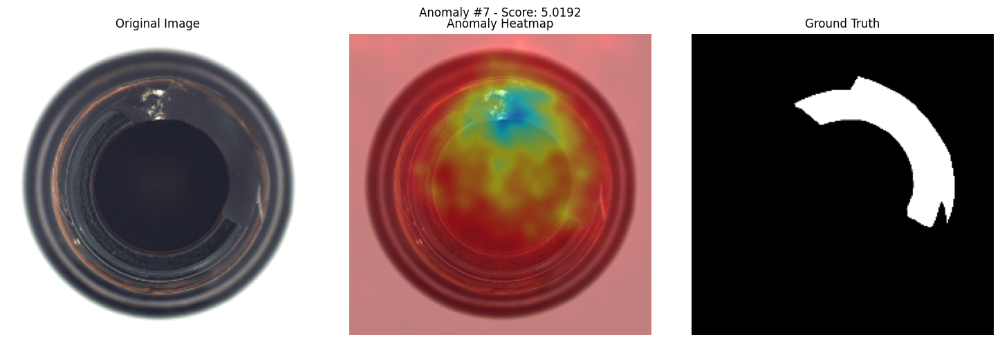

Anomaly #7 - Pixel AUC: 0.9109


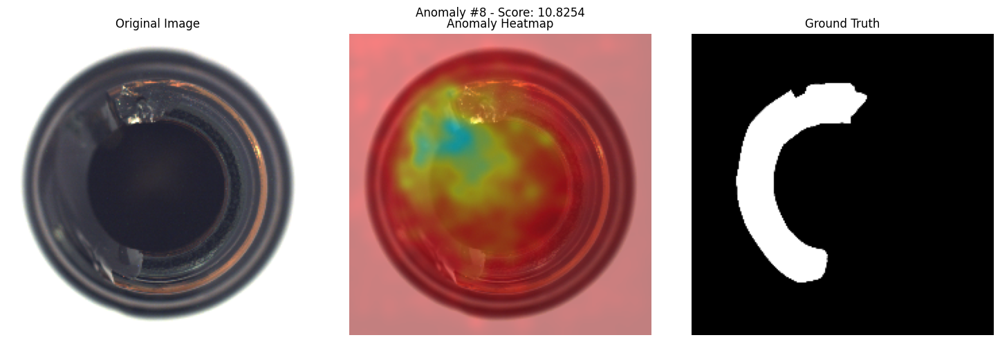

Anomaly #8 - Pixel AUC: 0.8856


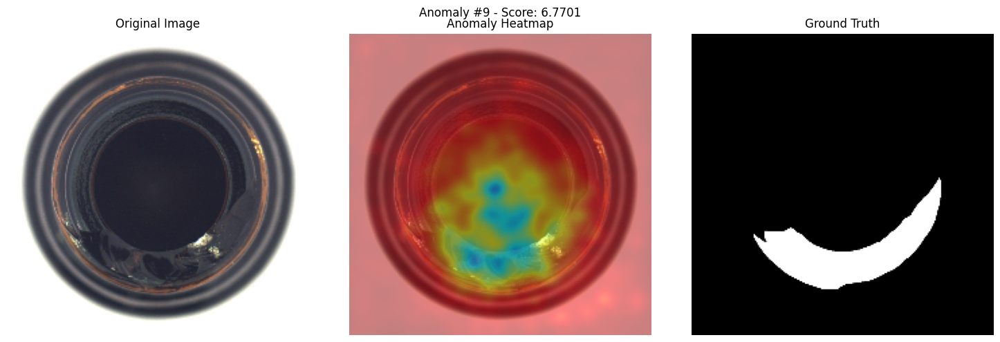

Anomaly #9 - Pixel AUC: 0.9234


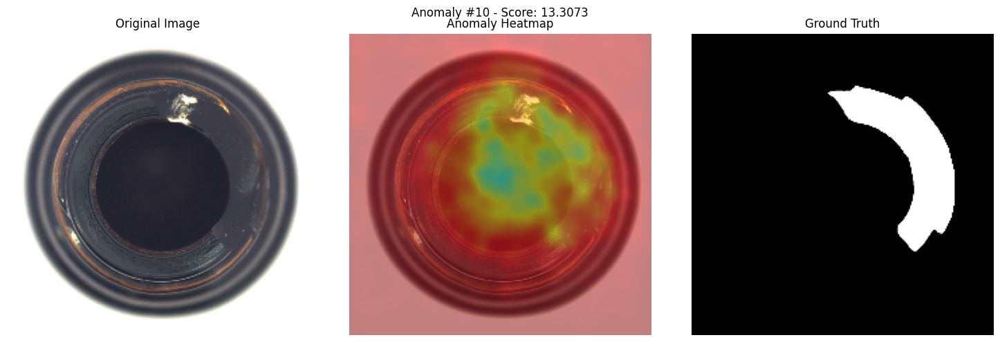

Anomaly #10 - Pixel AUC: 0.8857


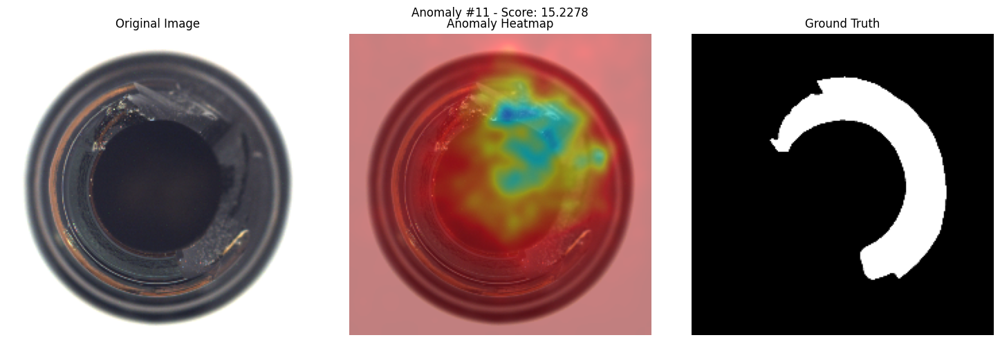

Anomaly #11 - Pixel AUC: 0.8754


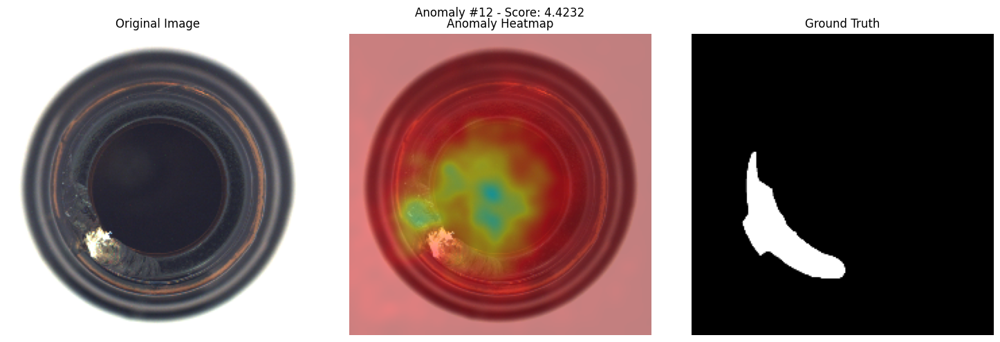

Anomaly #12 - Pixel AUC: 0.8950


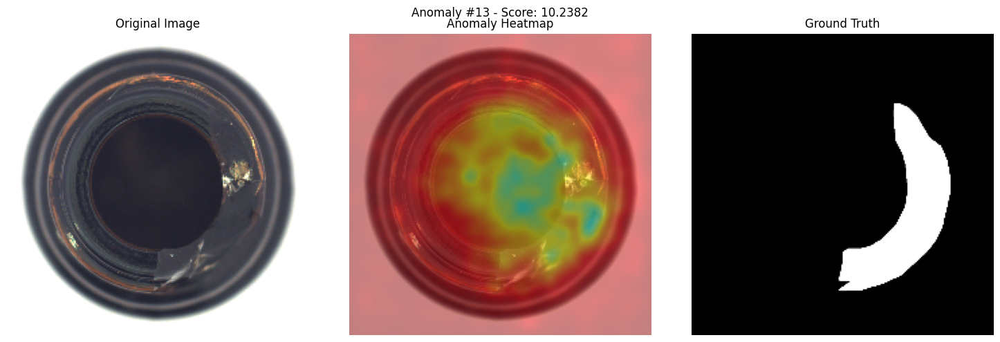

Anomaly #13 - Pixel AUC: 0.8789


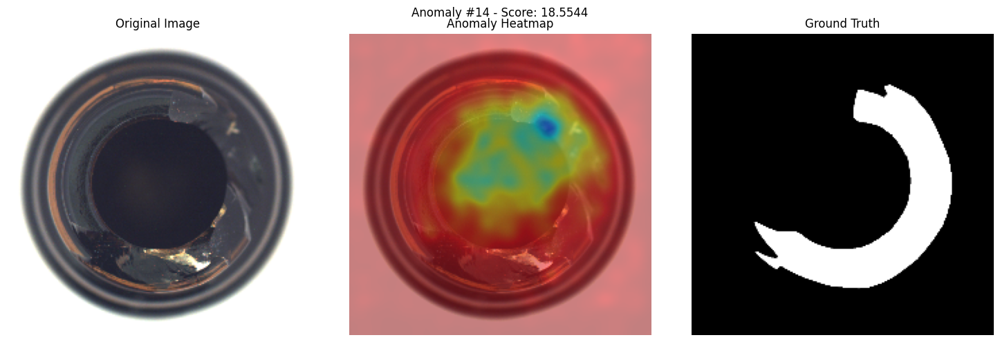

Anomaly #14 - Pixel AUC: 0.7662


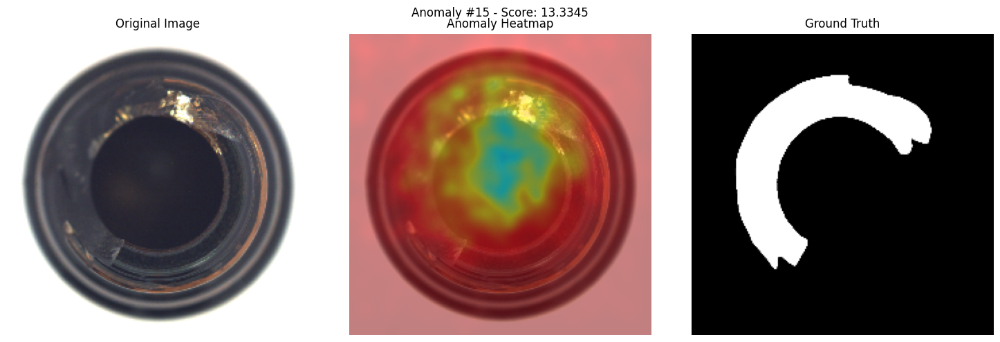

Anomaly #15 - Pixel AUC: 0.8297


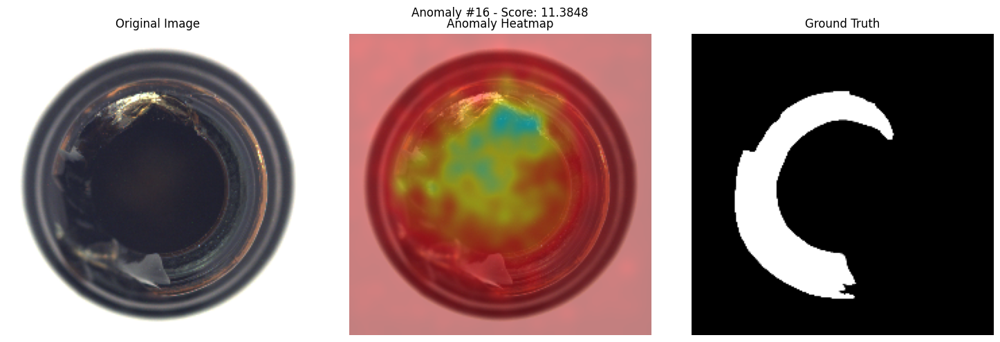

Anomaly #16 - Pixel AUC: 0.7979


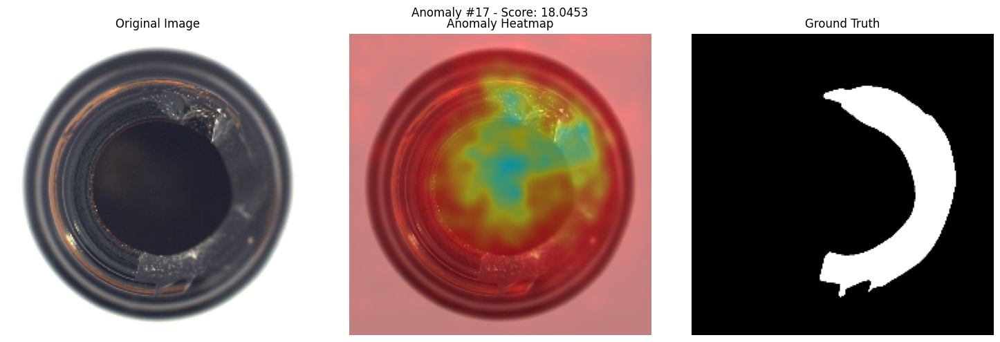

Anomaly #17 - Pixel AUC: 0.8200


In [ ]:
# lets first try for bottle class
run_demo('bottle')


==== Training Model ====
Windows detected, setting num_workers to 0 to avoid multiprocessing issues


c:\Users\Maadurga computer\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\utils\data\sampler.py:77: UserWarning: `data_source` argument is not used and will be removed in 2.2.0.You may still have custom implementation that utilizes it.
  warnings.warn(


Feature extractor: ResNet-18
Loss: Deviation

Training with configuration:
batch_size: 16
steps_per_epoch: 3
epochs: 10
ramdn_seed: 42
workers: 0
cuda: True
dataset_root: ./data/mvtec_anomaly_detection
experiment_dir: ./experiment
classname: carpet
weight_name: carpet_model.pkl
img_size: 224
n_anomaly: 5
n_scales: 2
backbone: resnet18
criterion: deviation
topk: 0.1

Initial evaluation:


Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

AUC-ROC: 0.5327, AUC-PR: 0.8266

Epoch 1/10


Epoch 0:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

AUC-ROC: 0.5064, AUC-PR: 0.7741

Epoch 2/10


Epoch 1:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

AUC-ROC: 0.5944, AUC-PR: 0.8561
Model saved to ./experiment\carpet_model.pkl
Best model saved (ROC-AUC: 0.5944)

Epoch 3/10


Epoch 2:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

AUC-ROC: 0.8244, AUC-PR: 0.9473
Model saved to ./experiment\carpet_model.pkl
Best model saved (ROC-AUC: 0.8244)

Epoch 4/10


Epoch 3:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

AUC-ROC: 0.8827, AUC-PR: 0.9663
Model saved to ./experiment\carpet_model.pkl
Best model saved (ROC-AUC: 0.8827)

Epoch 5/10


Epoch 4:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

AUC-ROC: 0.9324, AUC-PR: 0.9809
Model saved to ./experiment\carpet_model.pkl
Best model saved (ROC-AUC: 0.9324)

Epoch 6/10


Epoch 5:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

AUC-ROC: 0.9247, AUC-PR: 0.9794

Epoch 7/10


Epoch 6:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

AUC-ROC: 0.9137, AUC-PR: 0.9754

Epoch 8/10


Epoch 7:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

AUC-ROC: 0.8946, AUC-PR: 0.9695

Epoch 9/10


Epoch 8:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

AUC-ROC: 0.8724, AUC-PR: 0.9627

Epoch 10/10


Epoch 9:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

AUC-ROC: 0.8848, AUC-PR: 0.9660


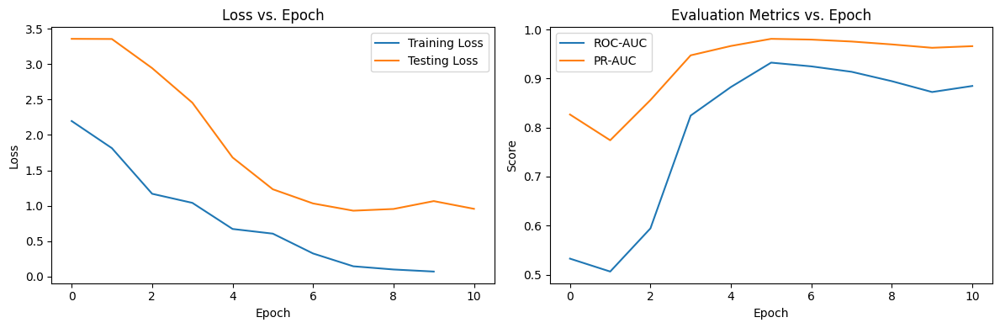


Training complete. Best ROC-AUC: 0.9324

==== Localizing Anomalies ====
Feature extractor: ResNet-18
Loaded model from ./experiment\carpet_model.pkl
Testing and visualising the model on few cases -
Detected anomalies: 3


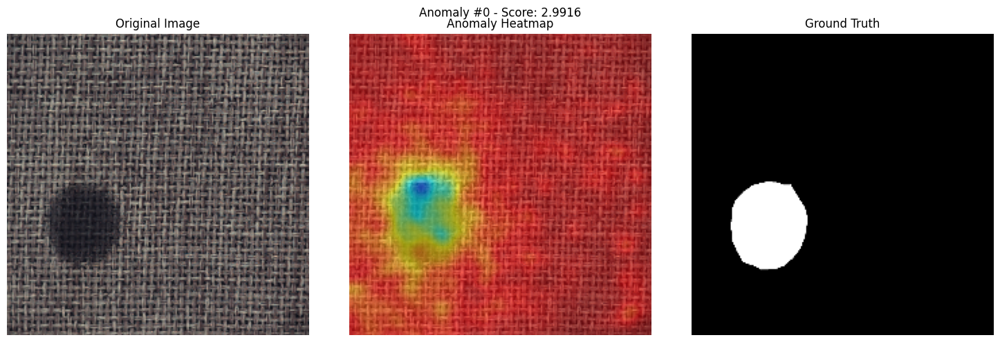

Anomaly #0 - Pixel AUC: 0.9905


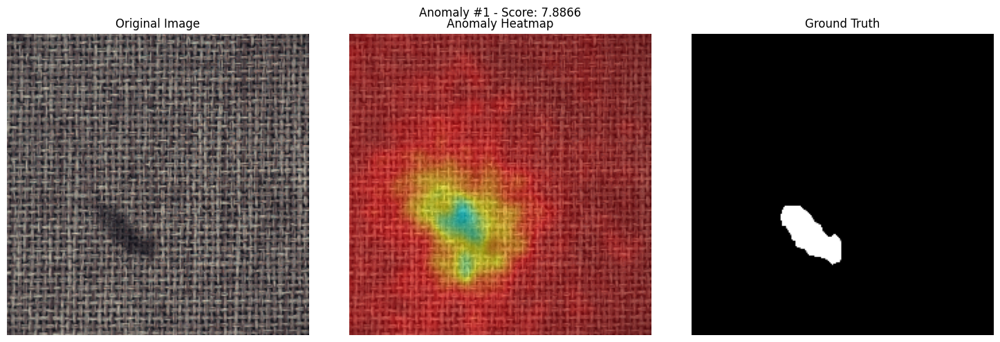

Anomaly #1 - Pixel AUC: 0.9874


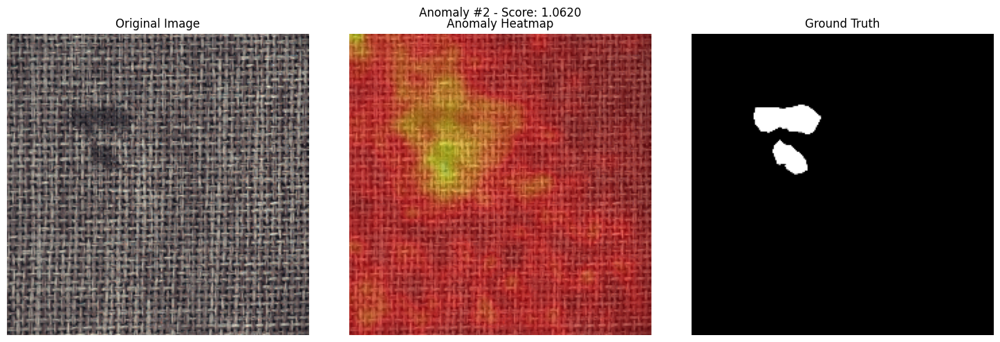

Anomaly #2 - Pixel AUC: 0.9766
Pixel-level AUC-ROC: 0.9848
Visualization results are saved in: ./experiment\vis

Demo complete!


In [14]:
run_demo('carpet')